In [1]:
import joblib
from scipy.stats import spearmanr
import numpy as np

In [2]:
data = joblib.load("../data/protein_precalcs.joblib")

In [3]:
from tqdm import tqdm

M = np.zeros((len(data), len(data)))

for i, d0 in tqdm(enumerate(data)):
    for j, d1 in enumerate(data):
        if i < j:
            continue
        v0 = d0["y_hat_train"]
        v1 = d1["y_hat_train"]
        M[i, j] = spearmanr(v0, v1)[0]
        M[j, i] = M[i, j]

2649it [08:05,  5.45it/s]


In [5]:
uniprot_acs = [d["uniprot_ac"] for d in data]
file_name = "../data/protein_protein_spearman_correlations.joblib"
joblib.dump((uniprot_acs))

[{'uniprot_ac': 'Q8IXH7',
  'auroc': (0.8321428571428572, 0.058035714285714246),
  'n_pos': 62,
  'y_hat_train': [0.028078783303499222,
   0.6460921168327332,
   0.19979126751422882,
   0.009344425052404404,
   0.01357247494161129,
   0.014868334867060184,
   0.011071219108998775,
   0.8613367676734924,
   0.008214466273784637,
   0.0650140643119812,
   0.013617569580674171,
   0.07843774557113647,
   0.27874523401260376,
   0.031130997464060783,
   0.04322455823421478,
   0.7287259697914124,
   0.02355143614113331,
   0.0013040142366662621,
   0.044824667274951935,
   0.19082605838775635,
   0.0030855925288051367,
   0.03613220155239105,
   0.03566126152873039,
   0.013748046942055225,
   0.006387019529938698,
   0.009157695807516575,
   0.03822541981935501,
   0.04807845130562782,
   0.01904330775141716,
   0.02050265483558178,
   0.013702457770705223,
   0.006501334253698587,
   0.026653409004211426,
   0.02211318351328373,
   0.7720295190811157,
   0.005994059145450592,
   0.668031

(array([1.424000e+03, 5.287800e+04, 4.990200e+05, 1.588480e+06,
        2.194448e+06, 1.566500e+06, 7.683080e+05, 2.648320e+05,
        6.336200e+04, 1.794900e+04]),
 array([-0.52911434, -0.37620291, -0.22329147, -0.07038004,  0.0825314 ,
         0.23544283,  0.38835426,  0.5412657 ,  0.69417713,  0.84708857,
         1.        ]),
 <BarContainer object of 10 artists>)

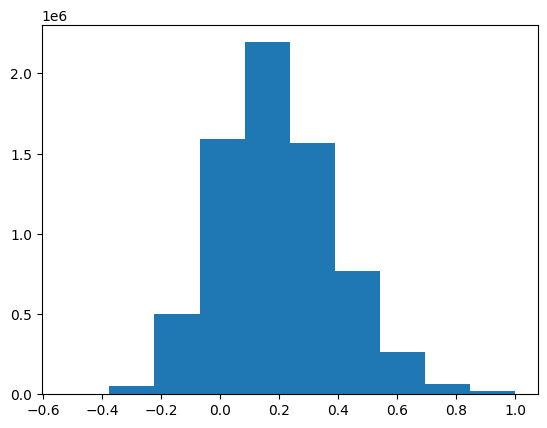

In [4]:
import matplotlib.pyplot as plt

plt.hist(M.ravel())